# Imports

In [1]:
import os, random, cv2, gc, torch, timm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
import torch.nn.functional as F
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, WeightedRandomSampler
from torchvision import datasets
from PIL import Image
from sklearn.metrics import cohen_kappa_score, classification_report, confusion_matrix, accuracy_score, balanced_accuracy_score
from sklearn.model_selection import train_test_split
import seaborn as sns


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

# Hyperparameter and Environment Configuration

In [2]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TRAIN_DIR = "/kaggle/input/dr-clean-bengraham-512/train"
VAL_DIR = "/kaggle/input/dr-clean-bengraham-512/val"

BATCH_SIZE = 32
ACCUM_STEPS = 2
EPOCHS = 30
LR = 5e-5
MIN_LR = 3e-6
WEIGHT_DECAY = 5e-4
WARM_UP = 3
PATIENCE = 7


---
# Data Preparation
---

### Data Pipeline & Augmentation

In [3]:
class AlbumentationsDataset(datasets.ImageFolder):
    def __getitem__(self, index):
        path, target = self.samples[index]
        sample = cv2.imread(path)
        sample = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB)
        
        if self.transform is not None:
            transformed = self.transform(image=sample)
            sample = transformed['image']
            
        return sample, target


train_transform = A.Compose([
    A.RandomResizedCrop(size=(512, 512), scale=(0.8, 1.0), p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5, border_mode=cv2.BORDER_REFLECT_101),
    A.RandomGamma(gamma_limit=(85, 115), p=0.3),
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(512, 512), 
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

### Class Balancing Using Weighted Sampler

In [4]:
# Initialize the Dataset
train_dataset = AlbumentationsDataset(TRAIN_DIR, transform=train_transform)
val_dataset = AlbumentationsDataset(VAL_DIR, transform=val_transform)


class_counts = [0] * len(train_dataset.classes)
for _, label in train_dataset.samples:
    class_counts[label] += 1

# The "1/sqrt" magic for balanced Kappa
class_weights = 1.0 / torch.sqrt(torch.tensor(class_counts, dtype=torch.float))
sample_weights = [class_weights[t] for t in train_dataset.targets]

sampler = WeightedRandomSampler(
    weights=sample_weights, 
    num_samples=len(sample_weights), 
    replacement=True
)

# DataLoaders
train_loader = DataLoader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    sampler=sampler,
    shuffle=False, 
    num_workers=4, 
    pin_memory=True
)

# Val dataset stays standard (Unbalanced for honest testing)
val_loader = DataLoader(
    val_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=4, 
    pin_memory=True
)

---
# Model & Training
---

### Model Architecture (CORAL Ordinal Head)

In [5]:
class CoralEffNet(nn.Module):
    def __init__(self, model_name='efficientnetv2_rw_s', num_classes=5):
        super().__init__()
        # Load backbone with higher drop_path_rate to force feature diversity
        self.backbone = timm.create_model(model_name, pretrained=True, drop_path_rate=0.15)
        
        # Increase resolution.
        in_features = self.backbone.get_classifier().in_features
        self.backbone.classifier = nn.Identity()
        
        self.fc = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(in_features, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, num_classes - 1)
        )

    def forward(self, x):
        features = self.backbone(x)
        return self.fc(features)

def label_to_ordinal(labels, num_classes=5):
    # Converts label into [1, 1, 0, 0]
    levels = torch.arange(num_classes - 1).to(labels.device)
    return (labels.unsqueeze(1) > levels).float()

def ordinal_to_label(logits):
    probs = torch.sigmoid(logits)
    return (probs > 0.50).sum(dim=1)

### Loss Function & Optimization

In [6]:
model = CoralEffNet().to(DEVICE)
gate_weights = torch.tensor([1.0, 1.1, 1.4, 1.8], device=DEVICE)
criterion = nn.BCEWithLogitsLoss(reduction='none')
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS - WARM_UP, eta_min=MIN_LR )
scaler = torch.amp.GradScaler() 

model.safetensors:   0%|          | 0.00/96.5M [00:00<?, ?B/s]

### Training Loop with Warmup

In [7]:
best_kappa = -1.0
early_stop_counter = 0  
history = [] 

# START TRAINING 
for epoch in range(EPOCHS):
    if epoch < WARM_UP:
        # Linear Warmup
        curr_lr = LR * (epoch + 1) / WARM_UP
        for param_group in optimizer.param_groups:
            param_group['lr'] = curr_lr
        
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}") 
    
    optimizer.zero_grad()
    for i, (images, labels) in enumerate(pbar):
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        
        with torch.amp.autocast(device_type=DEVICE.type):
            outputs = model(images)
            
            targets_ord = label_to_ordinal(labels)
            raw_loss = criterion(outputs, targets_ord)
            weighted_loss = (raw_loss * gate_weights.unsqueeze(0)).mean() 
            loss = weighted_loss / ACCUM_STEPS      

        
        scaler.scale(loss).backward()
        if (i + 1) % ACCUM_STEPS == 0:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0) 
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
            
        running_loss += loss.item() * ACCUM_STEPS
        train_preds = ordinal_to_label(outputs)
        correct += (train_preds == labels).sum().item()
        total += labels.size(0)
        pbar.set_postfix({'loss': f"{running_loss/(i+1):.4f}", 'acc': f"{correct/total:.4f}"})

    epoch_loss = running_loss / len(train_loader)
    epoch_acc = correct / total

    # VALIDATION 
    model.eval()
    all_preds, all_labs = [], []
    val_correct, val_total = 0, 0  
    val_running_loss = 0.0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            targets_ord = label_to_ordinal(labels)
            
            with torch.amp.autocast(device_type=DEVICE.type):
                outputs = model(images) 
                
                raw_loss_val = criterion(outputs, targets_ord)
                loss_val = (raw_loss_val * gate_weights.unsqueeze(0)).mean()
                
                val_running_loss += loss_val.item() * images.size(0) 
                val_preds = ordinal_to_label(outputs)
            
            all_preds.extend(val_preds.cpu().numpy())
            all_labs.extend(labels.cpu().numpy())
            val_correct += (val_preds == labels).sum().item()  
            val_total += labels.size(0)

             
    
    # Calculate Final Metrics for the Epoch
    val_loss = val_running_loss / val_total
    val_acc = val_correct / val_total
    bal_acc = balanced_accuracy_score(all_labs, all_preds)
    val_kappa = cohen_kappa_score(all_labs, all_preds, weights='quadratic')

    # history 
    history.append({
        'epoch': epoch + 1,
        'train_loss': epoch_loss,
        'val_loss': val_loss,
        'train_acc': epoch_acc,
        'val_acc': val_acc,  
        'val_kappa': val_kappa,
        'val_bal_acc': bal_acc
    })
    
    print(f"\nEPOCH {epoch+1}: Train Loss {epoch_loss:.4f} | Val Loss {val_loss:.4f}")
    print(f"Train Acc {epoch_acc:.4f} | Val Acc {val_acc:.4f} | Gap: {epoch_acc-val_acc:.4f}") 
    print(f"Balanced Val Acc: {bal_acc:.4f} | Kappa: {val_kappa:.4f}")

    # Recall check
    report = classification_report(
        all_labs, 
        all_preds, 
        target_names=train_dataset.classes, 
        output_dict=True, 
        zero_division=0
    )

    # Clean print for the console
    recall_str = " | ".join([f"C{k} Rec: {report[str(k)]['recall']:.3f}" for k in range(5)])
    print(f"Recall per Class: {recall_str}")
    
    # Learning rate optimize
    current_lr = optimizer.param_groups[0]['lr']
    print(f"Current LR: {current_lr:.2e}")
    
    # Saving Best Kappa
    if val_kappa > best_kappa:
        best_kappa = val_kappa
        torch.save(model.state_dict(), "best_DR_model.pth")
        print(f"New Best Kappa! Saved.")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        print(f"No improvement. Patience: {early_stop_counter}/{PATIENCE}")

    # Early stop
    if early_stop_counter >= PATIENCE:
        print(f"Early Stopping triggered at Epoch {epoch+1}")
        break

    if epoch >= WARM_UP:
        scheduler.step()
        if epoch == WARM_UP:
            scheduler.last_epoch = 0
        
    gc.collect()
    torch.cuda.empty_cache()

Epoch 1/30: 100%|██████████| 452/452 [06:59<00:00,  1.08it/s, loss=0.6852, acc=0.2244]



EPOCH 1: Train Loss 0.6852 | Val Loss 0.4622
Train Acc 0.2244 | Val Acc 0.0946 | Gap: 0.1297
Balanced Val Acc: 0.3117 | Kappa: 0.2395
Recall per Class: C0 Rec: 0.000 | C1 Rec: 0.957 | C2 Rec: 0.121 | C3 Rec: 0.023 | C4 Rec: 0.458
Current LR: 1.67e-05
New Best Kappa! Saved.


Epoch 2/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.4691, acc=0.3807]



EPOCH 2: Train Loss 0.4691 | Val Loss 0.3655
Train Acc 0.3807 | Val Acc 0.5510 | Gap: -0.1702
Balanced Val Acc: 0.4637 | Kappa: 0.5624
Recall per Class: C0 Rec: 0.612 | C1 Rec: 0.266 | C2 Rec: 0.396 | C3 Rec: 0.503 | C4 Rec: 0.542
Current LR: 3.33e-05
New Best Kappa! Saved.


Epoch 3/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.3881, acc=0.5049]



EPOCH 3: Train Loss 0.3881 | Val Loss 0.3078
Train Acc 0.5049 | Val Acc 0.6117 | Gap: -0.1068
Balanced Val Acc: 0.5086 | Kappa: 0.6398
Recall per Class: C0 Rec: 0.676 | C1 Rec: 0.350 | C2 Rec: 0.439 | C3 Rec: 0.571 | C4 Rec: 0.507
Current LR: 5.00e-05
New Best Kappa! Saved.


Epoch 4/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.3409, acc=0.5613]



EPOCH 4: Train Loss 0.3409 | Val Loss 0.2686
Train Acc 0.5613 | Val Acc 0.7102 | Gap: -0.1489
Balanced Val Acc: 0.5252 | Kappa: 0.6932
Recall per Class: C0 Rec: 0.815 | C1 Rec: 0.235 | C2 Rec: 0.464 | C3 Rec: 0.520 | C4 Rec: 0.592
Current LR: 5.00e-05
New Best Kappa! Saved.


Epoch 5/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.3195, acc=0.5872]



EPOCH 5: Train Loss 0.3195 | Val Loss 0.2832
Train Acc 0.5872 | Val Acc 0.6553 | Gap: -0.0681
Balanced Val Acc: 0.5465 | Kappa: 0.6915
Recall per Class: C0 Rec: 0.733 | C1 Rec: 0.329 | C2 Rec: 0.441 | C3 Rec: 0.560 | C4 Rec: 0.669
Current LR: 4.98e-05
No improvement. Patience: 1/7


Epoch 6/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.2947, acc=0.6153]



EPOCH 6: Train Loss 0.2947 | Val Loss 0.2703
Train Acc 0.6153 | Val Acc 0.6815 | Gap: -0.0661
Balanced Val Acc: 0.5466 | Kappa: 0.7004
Recall per Class: C0 Rec: 0.749 | C1 Rec: 0.327 | C2 Rec: 0.559 | C3 Rec: 0.514 | C4 Rec: 0.585
Current LR: 4.97e-05
New Best Kappa! Saved.


Epoch 7/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.2772, acc=0.6258]



EPOCH 7: Train Loss 0.2772 | Val Loss 0.2675
Train Acc 0.6258 | Val Acc 0.6865 | Gap: -0.0607
Balanced Val Acc: 0.5647 | Kappa: 0.7195
Recall per Class: C0 Rec: 0.773 | C1 Rec: 0.307 | C2 Rec: 0.456 | C3 Rec: 0.606 | C4 Rec: 0.683
Current LR: 4.92e-05
New Best Kappa! Saved.


Epoch 8/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.2616, acc=0.6438]



EPOCH 8: Train Loss 0.2616 | Val Loss 0.3063
Train Acc 0.6438 | Val Acc 0.6240 | Gap: 0.0198
Balanced Val Acc: 0.5634 | Kappa: 0.6567
Recall per Class: C0 Rec: 0.657 | C1 Rec: 0.350 | C2 Rec: 0.595 | C3 Rec: 0.617 | C4 Rec: 0.599
Current LR: 4.84e-05
No improvement. Patience: 1/7


Epoch 9/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.2463, acc=0.6640]



EPOCH 9: Train Loss 0.2463 | Val Loss 0.2592
Train Acc 0.6640 | Val Acc 0.7008 | Gap: -0.0368
Balanced Val Acc: 0.5665 | Kappa: 0.7114
Recall per Class: C0 Rec: 0.777 | C1 Rec: 0.305 | C2 Rec: 0.542 | C3 Rec: 0.554 | C4 Rec: 0.655
Current LR: 4.73e-05
No improvement. Patience: 2/7


Epoch 10/30: 100%|██████████| 452/452 [06:59<00:00,  1.08it/s, loss=0.2365, acc=0.6760]



EPOCH 10: Train Loss 0.2365 | Val Loss 0.2648
Train Acc 0.6760 | Val Acc 0.6798 | Gap: -0.0038
Balanced Val Acc: 0.5690 | Kappa: 0.7070
Recall per Class: C0 Rec: 0.740 | C1 Rec: 0.333 | C2 Rec: 0.569 | C3 Rec: 0.583 | C4 Rec: 0.620
Current LR: 4.60e-05
No improvement. Patience: 3/7


Epoch 11/30: 100%|██████████| 452/452 [06:58<00:00,  1.08it/s, loss=0.2198, acc=0.6886]



EPOCH 11: Train Loss 0.2198 | Val Loss 0.2532
Train Acc 0.6886 | Val Acc 0.7155 | Gap: -0.0269
Balanced Val Acc: 0.5481 | Kappa: 0.7188
Recall per Class: C0 Rec: 0.795 | C1 Rec: 0.280 | C2 Rec: 0.580 | C3 Rec: 0.543 | C4 Rec: 0.542
Current LR: 4.44e-05
No improvement. Patience: 4/7


Epoch 12/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.2136, acc=0.7004]



EPOCH 12: Train Loss 0.2136 | Val Loss 0.2548
Train Acc 0.7004 | Val Acc 0.7158 | Gap: -0.0154
Balanced Val Acc: 0.5595 | Kappa: 0.7236
Recall per Class: C0 Rec: 0.795 | C1 Rec: 0.311 | C2 Rec: 0.560 | C3 Rec: 0.554 | C4 Rec: 0.577
Current LR: 4.25e-05
New Best Kappa! Saved.


Epoch 13/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.2038, acc=0.7162]



EPOCH 13: Train Loss 0.2038 | Val Loss 0.2792
Train Acc 0.7162 | Val Acc 0.6950 | Gap: 0.0212
Balanced Val Acc: 0.5662 | Kappa: 0.7035
Recall per Class: C0 Rec: 0.756 | C1 Rec: 0.303 | C2 Rec: 0.615 | C3 Rec: 0.594 | C4 Rec: 0.563
Current LR: 4.04e-05
No improvement. Patience: 1/7


Epoch 14/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1897, acc=0.7308]



EPOCH 14: Train Loss 0.1897 | Val Loss 0.2962
Train Acc 0.7308 | Val Acc 0.6702 | Gap: 0.0605
Balanced Val Acc: 0.5746 | Kappa: 0.6934
Recall per Class: C0 Rec: 0.717 | C1 Rec: 0.370 | C2 Rec: 0.602 | C3 Rec: 0.606 | C4 Rec: 0.577
Current LR: 3.81e-05
No improvement. Patience: 2/7


Epoch 15/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1882, acc=0.7361]



EPOCH 15: Train Loss 0.1882 | Val Loss 0.2848
Train Acc 0.7361 | Val Acc 0.6799 | Gap: 0.0562
Balanced Val Acc: 0.5453 | Kappa: 0.6987
Recall per Class: C0 Rec: 0.739 | C1 Rec: 0.331 | C2 Rec: 0.595 | C3 Rec: 0.554 | C4 Rec: 0.507
Current LR: 3.57e-05
No improvement. Patience: 3/7


Epoch 16/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1803, acc=0.7448]



EPOCH 16: Train Loss 0.1803 | Val Loss 0.2829
Train Acc 0.7448 | Val Acc 0.6779 | Gap: 0.0669
Balanced Val Acc: 0.5424 | Kappa: 0.7013
Recall per Class: C0 Rec: 0.730 | C1 Rec: 0.378 | C2 Rec: 0.618 | C3 Rec: 0.486 | C4 Rec: 0.500
Current LR: 3.31e-05
No improvement. Patience: 4/7


Epoch 17/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1702, acc=0.7570]



EPOCH 17: Train Loss 0.1702 | Val Loss 0.2659
Train Acc 0.7570 | Val Acc 0.7264 | Gap: 0.0305
Balanced Val Acc: 0.5524 | Kappa: 0.7278
Recall per Class: C0 Rec: 0.812 | C1 Rec: 0.321 | C2 Rec: 0.552 | C3 Rec: 0.549 | C4 Rec: 0.528
Current LR: 3.05e-05
New Best Kappa! Saved.


Epoch 18/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1660, acc=0.7625]



EPOCH 18: Train Loss 0.1660 | Val Loss 0.2944
Train Acc 0.7625 | Val Acc 0.6778 | Gap: 0.0848
Balanced Val Acc: 0.5525 | Kappa: 0.6981
Recall per Class: C0 Rec: 0.729 | C1 Rec: 0.372 | C2 Rec: 0.618 | C3 Rec: 0.509 | C4 Rec: 0.535
Current LR: 2.78e-05
No improvement. Patience: 1/7


Epoch 19/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1595, acc=0.7718]



EPOCH 19: Train Loss 0.1595 | Val Loss 0.2948
Train Acc 0.7718 | Val Acc 0.6899 | Gap: 0.0819
Balanced Val Acc: 0.5433 | Kappa: 0.6973
Recall per Class: C0 Rec: 0.749 | C1 Rec: 0.344 | C2 Rec: 0.620 | C3 Rec: 0.497 | C4 Rec: 0.507
Current LR: 2.51e-05
No improvement. Patience: 2/7


Epoch 20/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1546, acc=0.7767]



EPOCH 20: Train Loss 0.1546 | Val Loss 0.2879
Train Acc 0.7767 | Val Acc 0.7027 | Gap: 0.0740
Balanced Val Acc: 0.5393 | Kappa: 0.7135
Recall per Class: C0 Rec: 0.769 | C1 Rec: 0.339 | C2 Rec: 0.612 | C3 Rec: 0.497 | C4 Rec: 0.479
Current LR: 2.24e-05
No improvement. Patience: 3/7


Epoch 21/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1467, acc=0.7877]



EPOCH 21: Train Loss 0.1467 | Val Loss 0.2912
Train Acc 0.7877 | Val Acc 0.7077 | Gap: 0.0801
Balanced Val Acc: 0.5676 | Kappa: 0.7102
Recall per Class: C0 Rec: 0.778 | C1 Rec: 0.321 | C2 Rec: 0.581 | C3 Rec: 0.594 | C4 Rec: 0.563
Current LR: 1.97e-05
No improvement. Patience: 4/7


Epoch 22/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1442, acc=0.7963]



EPOCH 22: Train Loss 0.1442 | Val Loss 0.2932
Train Acc 0.7963 | Val Acc 0.7028 | Gap: 0.0935
Balanced Val Acc: 0.5645 | Kappa: 0.7093
Recall per Class: C0 Rec: 0.771 | C1 Rec: 0.348 | C2 Rec: 0.576 | C3 Rec: 0.600 | C4 Rec: 0.528
Current LR: 1.71e-05
No improvement. Patience: 5/7


Epoch 23/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1404, acc=0.8027]



EPOCH 23: Train Loss 0.1404 | Val Loss 0.3045
Train Acc 0.8027 | Val Acc 0.6876 | Gap: 0.1151
Balanced Val Acc: 0.5560 | Kappa: 0.6975
Recall per Class: C0 Rec: 0.741 | C1 Rec: 0.358 | C2 Rec: 0.627 | C3 Rec: 0.554 | C4 Rec: 0.500
Current LR: 1.47e-05
No improvement. Patience: 6/7


Epoch 24/30: 100%|██████████| 452/452 [06:57<00:00,  1.08it/s, loss=0.1346, acc=0.8060]



EPOCH 24: Train Loss 0.1346 | Val Loss 0.2895
Train Acc 0.8060 | Val Acc 0.7104 | Gap: 0.0957
Balanced Val Acc: 0.5535 | Kappa: 0.7163
Recall per Class: C0 Rec: 0.783 | C1 Rec: 0.335 | C2 Rec: 0.580 | C3 Rec: 0.583 | C4 Rec: 0.486
Current LR: 1.24e-05
No improvement. Patience: 7/7
Early Stopping triggered at Epoch 24


---
# Model Evaluations
---

### Unoptimized Threshold Model Evaluation

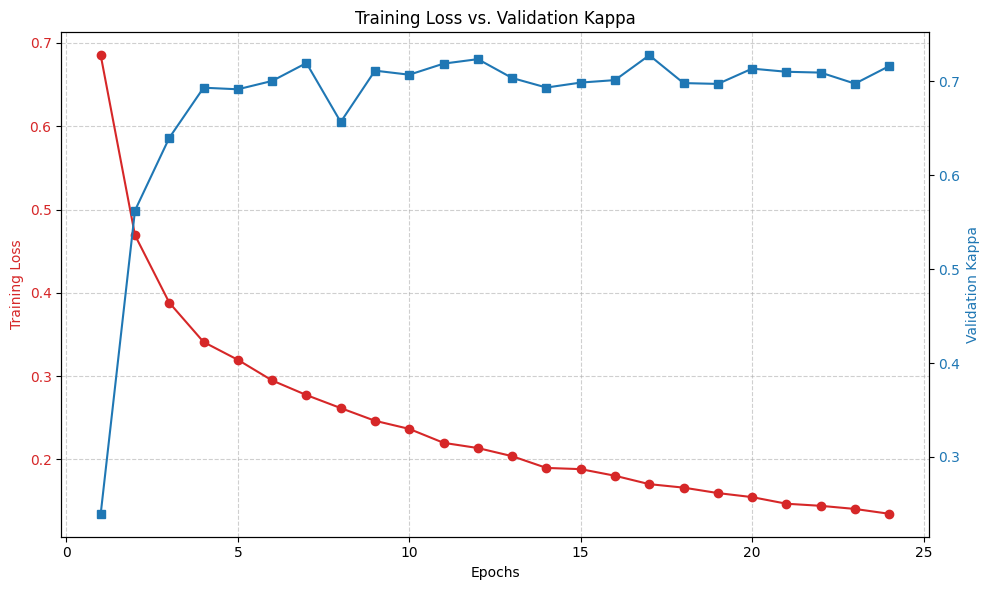

In [8]:
def plot_training_results(history):
    epochs = range(1, len(history) + 1)
    train_loss = [h['train_loss'] for h in history]
    val_kappa = [h['val_kappa'] for h in history]

    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot Loss 
    color = 'tab:red'
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Training Loss', color=color)
    ax1.plot(epochs, train_loss, color=color, marker='o', label='Train Loss')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, linestyle='--', alpha=0.6)

    # Plot Kappa on the same chart (Secondary Axis) 
    ax2 = ax1.twinx() 
    color = 'tab:blue'
    ax2.set_ylabel('Validation Kappa', color=color)
    ax2.plot(epochs, val_kappa, color=color, marker='s', label='Val Kappa')
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title('Training Loss vs. Validation Kappa')
    fig.tight_layout()
    plt.savefig('learning_curves.png')
    plt.show()

plot_training_results(history)

In [9]:
def final_evaluation(model, val_loader, device, thresholds=None):
    model.load_state_dict(torch.load("best_DR_model.pth"))
    model.eval()
    
    all_preds, all_labs = [], []
    all_logits = []

    # Collect Logits/Probs
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Final Evaluation"):
            images = images.to(device)
            with torch.amp.autocast(device_type=DEVICE.type):
                logits = model(images)
                # We work with Sigmoid for ordinal regression
                probs = torch.sigmoid(logits)
                
            all_logits.append(probs.cpu())
            all_labs.extend(labels.cpu().numpy())
    
    all_logits = torch.cat(all_logits, dim=0)
    
    # Decision Logic (Standard vs Optimized)
    if thresholds is None:
        print("\nRUNNING RAW EVALUATION (Standard 0.5 Thresholds)... ")
        # Standard ordinal_to_label logic
        all_preds = (all_logits > 0.5).sum(axis=1).numpy()
    else:
        print(f"\nRUNNING OPTIMIZED EVALUATION (Custom Thresholds)... ")
        print(f"Thresholds: {[round(t, 4) for t in thresholds]}")
        # Optimized 
        all_preds = (all_logits > torch.tensor(thresholds)).sum(axis=1).numpy()

    # Metrics & Reporting
    classes = ["No DR", "Mild", "Moderate", "Severe", "Proliferative"]
    
    # Metrics
    acc = accuracy_score(all_labs, all_preds)
    bal_acc = balanced_accuracy_score(all_labs, all_preds)
    kappa = cohen_kappa_score(all_labs, all_preds, weights='quadratic')
    
    print("\nDetailed Classification Report:")
    print(classification_report(all_labs, all_preds, target_names=classes, zero_division=0))

    print(f"Overall Accuracy:   {acc:.4f}")
    print(f"Balanced Accuracy:  {bal_acc:.4f}")
    print(f"Quadratic Kappa:    {kappa:.4f}")
    
    # Confusion Matrix
    cm = confusion_matrix(all_labs, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(f'Confusion Matrix (Kappa: {kappa:.4f})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


Final Evaluation: 100%|██████████| 220/220 [00:53<00:00,  4.11it/s]



RUNNING RAW EVALUATION (Standard 0.5 Thresholds)... 

Detailed Classification Report:
               precision    recall  f1-score   support

        No DR       0.91      0.81      0.86      5162
         Mild       0.14      0.32      0.20       489
     Moderate       0.60      0.55      0.58      1058
       Severe       0.40      0.55      0.46       175
Proliferative       0.73      0.53      0.61       142

     accuracy                           0.73      7026
    macro avg       0.56      0.55      0.54      7026
 weighted avg       0.79      0.73      0.75      7026

Overall Accuracy:   0.7264
Balanced Accuracy:  0.5524
Quadratic Kappa:    0.7278


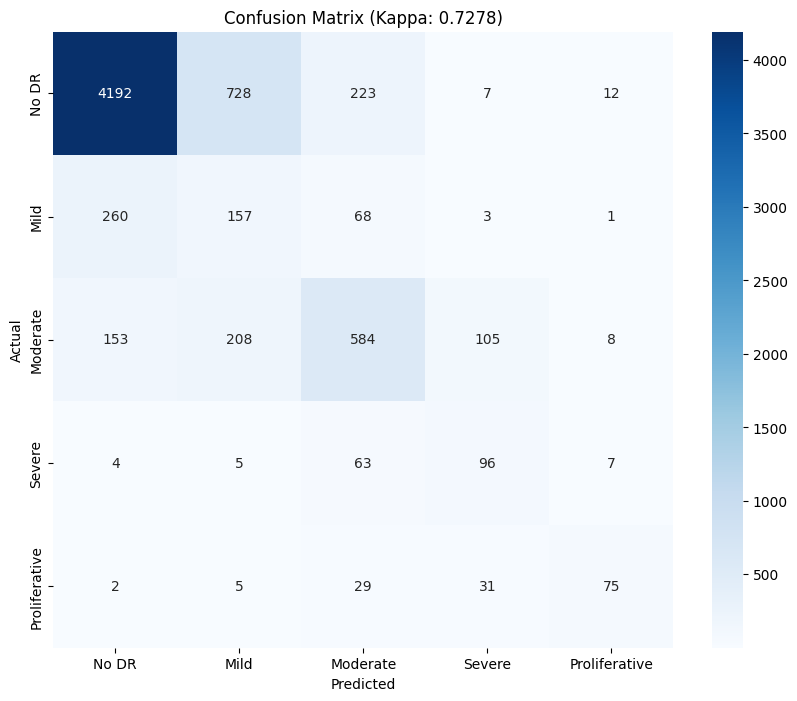

In [10]:
final_evaluation(model, val_loader, DEVICE, thresholds=None)

### Model Threshold Optimization 

In [11]:
from scipy.optimize import minimize

def optimize_thresholds(model, val_loader, device):
    model.eval()
    all_logits = []
    all_targets = []

    print("Extracting Logits for Calibration...")
    with torch.no_grad():
        for images, labels in tqdm(val_loader):
            with torch.amp.autocast('cuda'):
                logits = model(images.to(device))
            all_logits.append(logits.cpu().numpy())
            all_targets.append(labels.numpy())

    all_logits = np.concatenate(all_logits)
    all_targets = np.concatenate(all_targets)

    # The Objective: Maximize Kappa (Minimize -Kappa)
    def kappa_objective(thresholds):
        probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
        preds = (probs > thresholds).sum(axis=1)
        # return negative. "minimize" looks for the lowest value
        return -cohen_kappa_score(all_targets, preds, weights='quadratic')

    print("Searching for Optimal Thresholds...")
    initial_thresholds = [0.5, 0.5, 0.5, 0.5]
    res = minimize(kappa_objective, initial_thresholds, method='Nelder-Mead')
    
    best_thresholds = res.x
    best_kappa = -res.fun
    
    print("\n" + "="*40)
    print(f"Base Kappa (0.5): {-kappa_objective([0.5]*4):.4f}")
    print(f"Optimized Kappa:  {best_kappa:.4f}")
    print(f"Best Thresholds:  {best_thresholds}")
    print("="*40)
    
    return best_thresholds

### Optimized Threshold Model Evaluation

Extracting Logits for Calibration...


100%|██████████| 220/220 [00:53<00:00,  4.09it/s]
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: Runt

Searching for Optimal Thresholds...


/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_24/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 


Base Kappa (0.5): 0.7278
Optimized Kappa:  0.7536
Best Thresholds:  [0.67174419 0.66400819 0.35979844 0.36543909]


Final Evaluation: 100%|██████████| 220/220 [00:53<00:00,  4.08it/s]



RUNNING OPTIMIZED EVALUATION (Custom Thresholds)... 
Thresholds: [np.float64(0.6717), np.float64(0.664), np.float64(0.3598), np.float64(0.3654)]

Detailed Classification Report:
               precision    recall  f1-score   support

        No DR       0.90      0.90      0.90      5162
         Mild       0.17      0.24      0.20       489
     Moderate       0.66      0.48      0.56      1058
       Severe       0.38      0.57      0.45       175
Proliferative       0.69      0.54      0.61       142

     accuracy                           0.78      7026
    macro avg       0.56      0.55      0.54      7026
 weighted avg       0.79      0.78      0.78      7026

Overall Accuracy:   0.7760
Balanced Accuracy:  0.5477
Quadratic Kappa:    0.7536


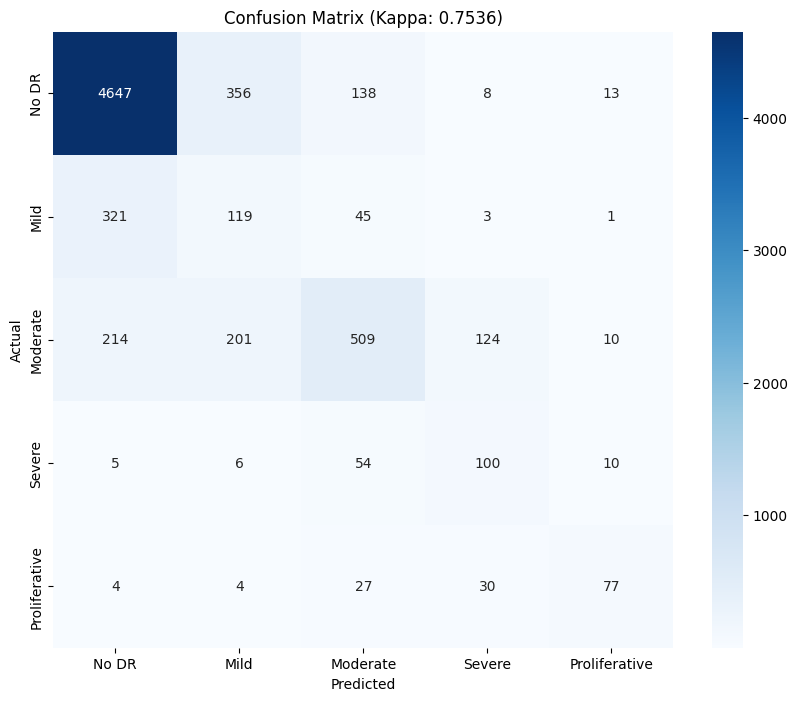

In [12]:
best_thresholds = optimize_thresholds(model, val_loader, DEVICE)
final_evaluation(model, val_loader, DEVICE, thresholds=best_thresholds)

# Grad Cam

In [13]:
!pip install -q grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 54.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [14]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

def plot_gradcam_effnet(img_path, actual_label, model, transform, thresholds):
    model.eval()
    
    img_pil = Image.open(img_path).convert('RGB')
    img_np_orig = np.array(img_pil)
    img_resized = cv2.resize(img_np_orig, (512, 512))
    input_tensor = transform(image=img_resized)['image'].unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        logits = model(input_tensor)
        probs = torch.sigmoid(logits)
        thresh_tensor = torch.tensor(thresholds).to(DEVICE)
        pred = (probs > thresh_tensor).sum(dim=1).item()
    
    # Determine target gate
    target_idx = max(0, min(3, pred - 1)) if pred > 0 else 0
    
    # Target Layer for EfficientNetV2 (timm)
    target_layers = [model.backbone.conv_head] 
    
    with GradCAM(model=model, target_layers=target_layers) as cam:
        targets = [ClassifierOutputTarget(target_idx)]
        grayscale_cam = cam(input_tensor=input_tensor, 
                            targets=targets,
                            aug_smooth=True, 
                            eigen_smooth=True)[0, :]
        
        visualization = show_cam_on_image(img_resized/255.0, grayscale_cam, use_rgb=True)
        
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img_resized)
    plt.title(f"Actual: {actual_label}\n(EffNet Input)", fontsize=10)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(visualization)
    plt.title(f"EffNet Pred: Stage {pred}\n(Gate {target_idx})", fontsize=10, color='blue')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()


model = CoralEffNet().to(DEVICE)
model.load_state_dict(torch.load("best_DR_model.pth"))

class_samples = {}

for path, label in val_dataset.samples:
    if label not in class_samples:
        class_samples[label] = path
     # Stop once we have 0, 1, 2, 3, and 4
    if len(class_samples) == 5:
        break


EffNet Audit: Standard 0.5 Thresholds

EfficientNet Audit: Class 0


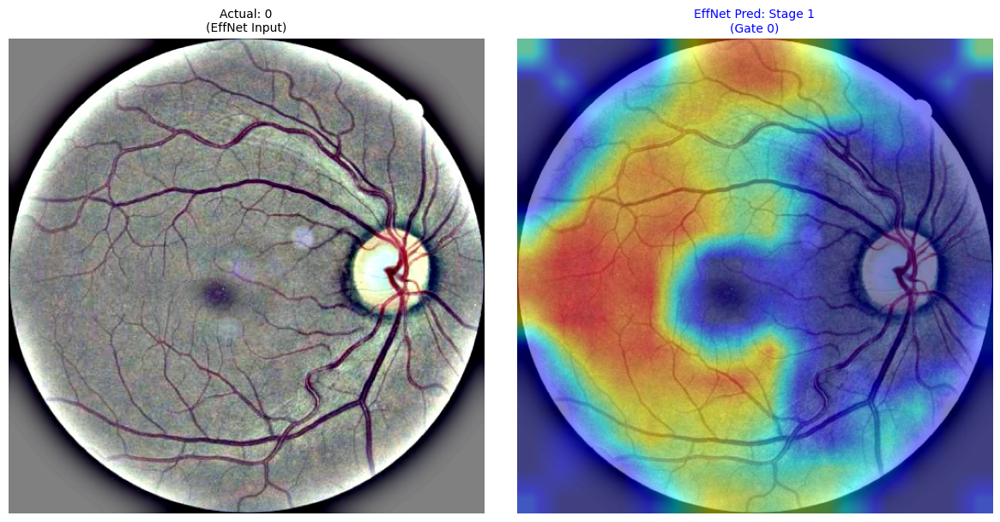


EfficientNet Audit: Class 1


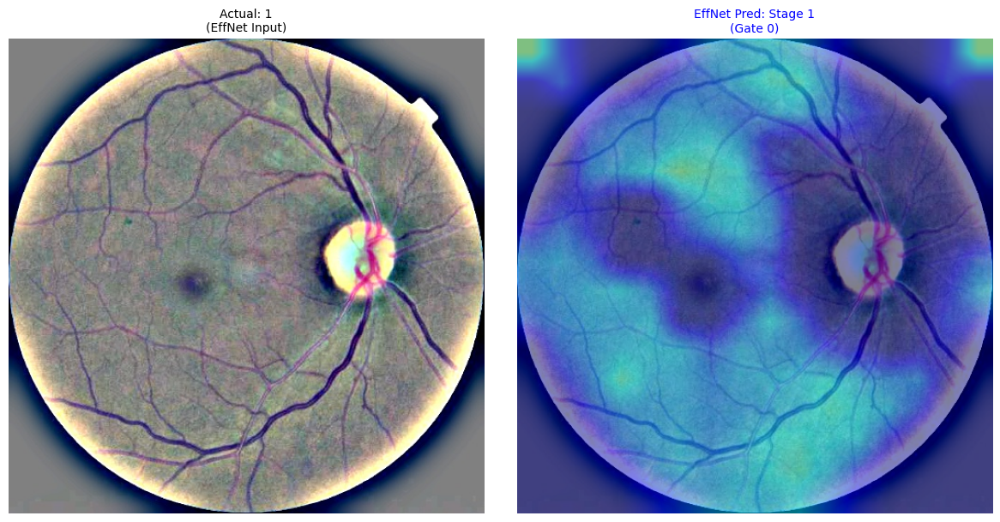


EfficientNet Audit: Class 2


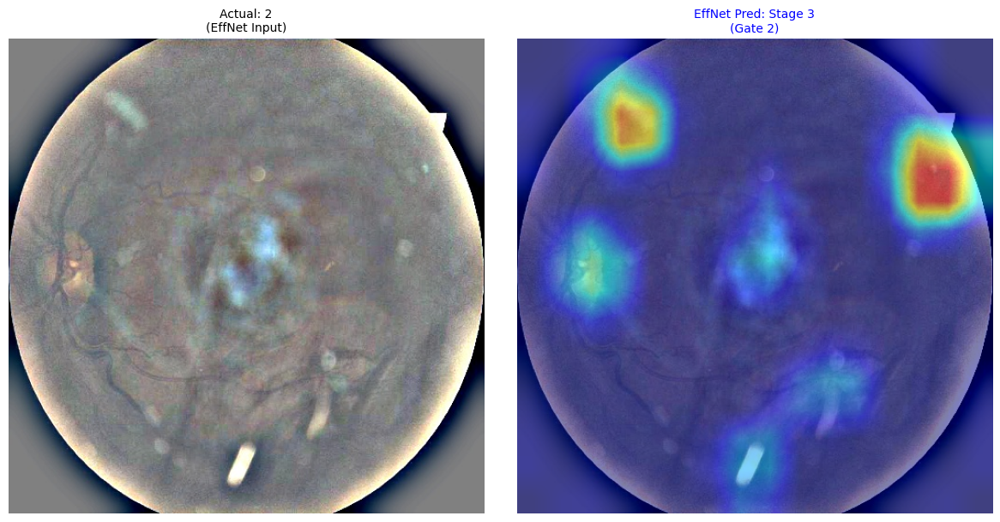


EfficientNet Audit: Class 3


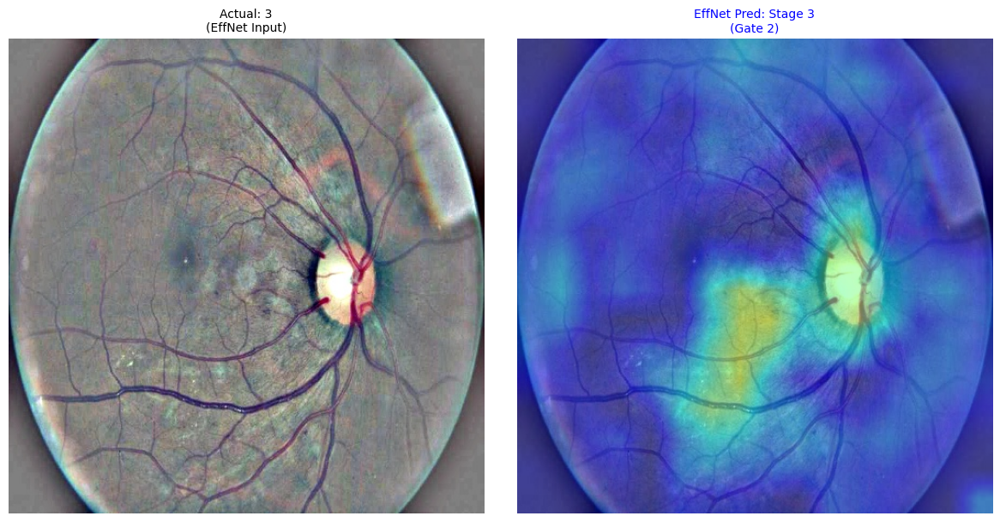


EfficientNet Audit: Class 4


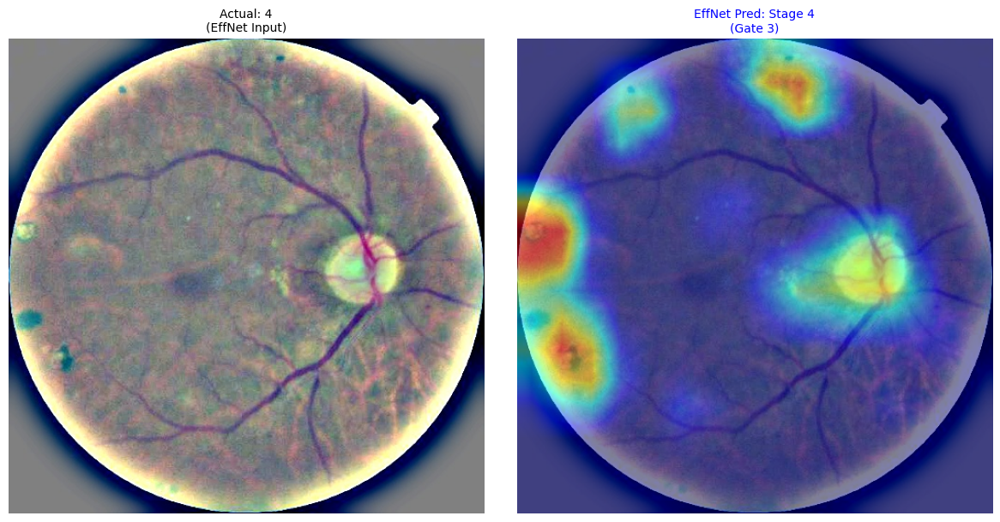

In [15]:
# Unoptimized Run
print("EffNet Audit: Standard 0.5 Thresholds")
standard_thresholds = [0.5, 0.5, 0.5, 0.5]
for label in sorted(class_samples.keys()):
    img_path = class_samples[label]
    print(f"\nEfficientNet Audit: Class {label}")
    plot_gradcam_effnet(img_path, label, model, val_transform, standard_thresholds)


EffNet Audit: Optimized Thresholds [0.67174419 0.66400819 0.35979844 0.36543909] 

EfficientNet Audit: Class 0


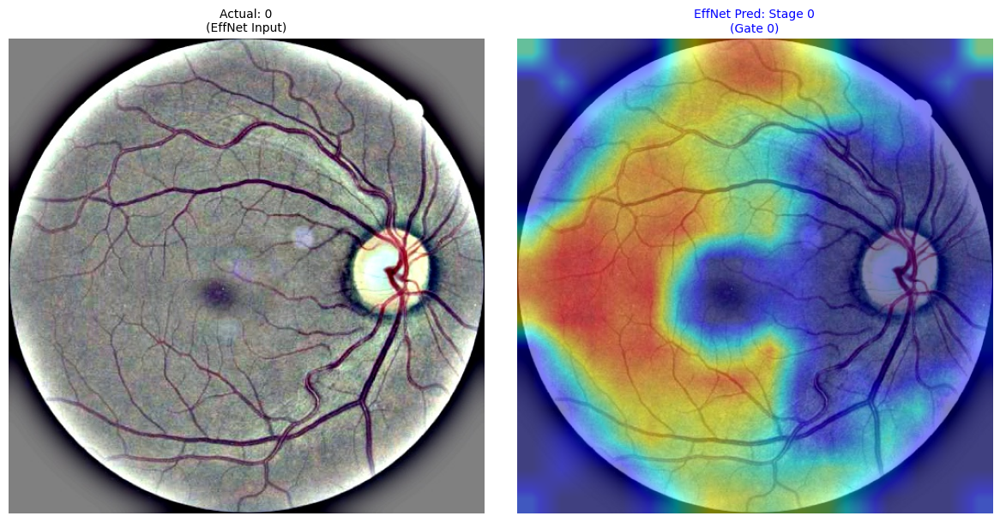


EfficientNet Audit: Class 1


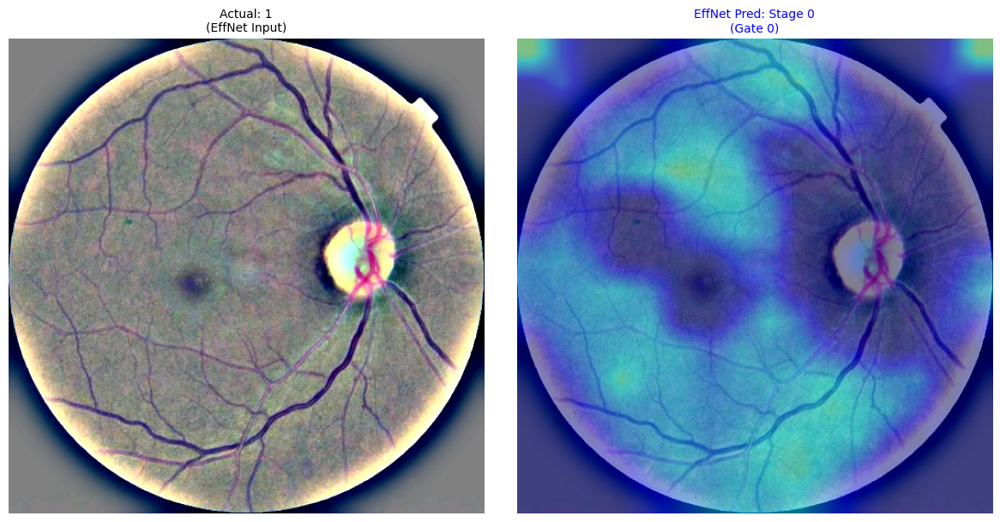


EfficientNet Audit: Class 2


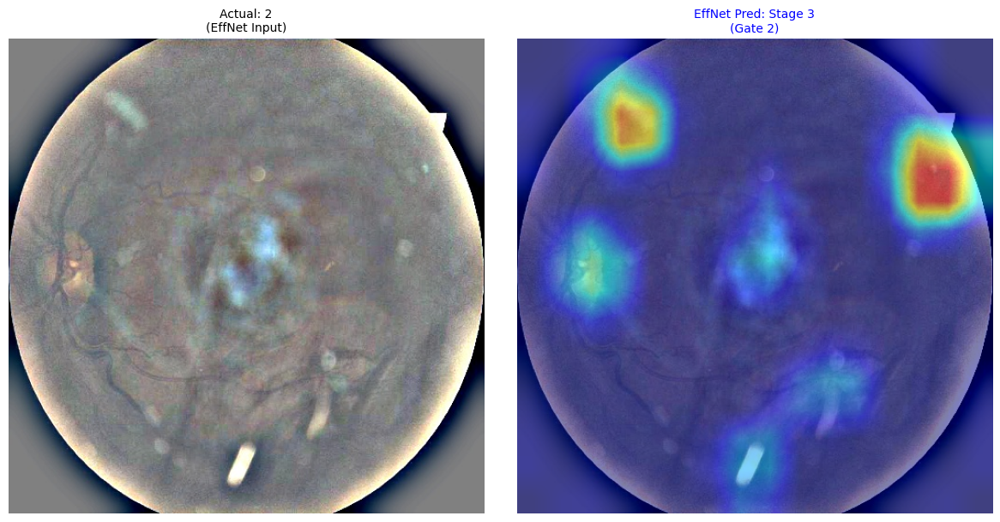


EfficientNet Audit: Class 3


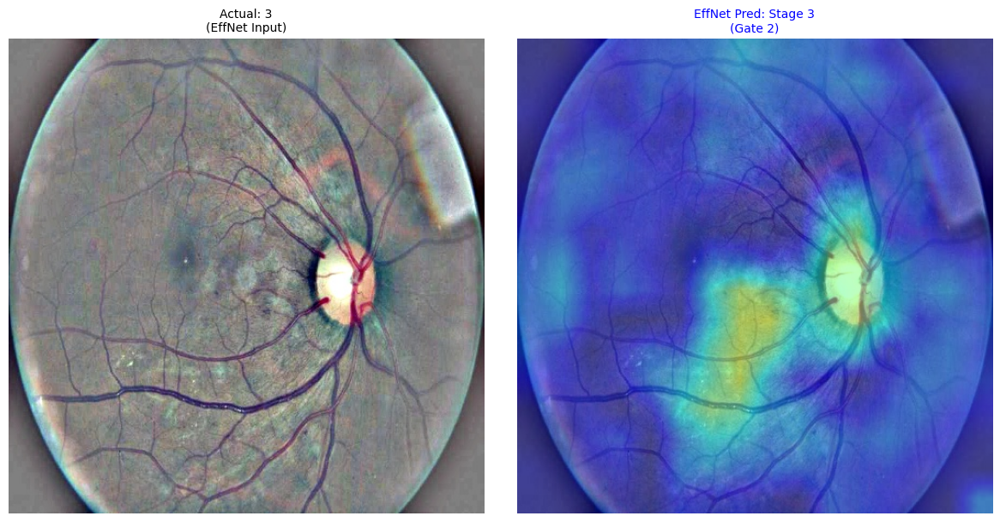


EfficientNet Audit: Class 4


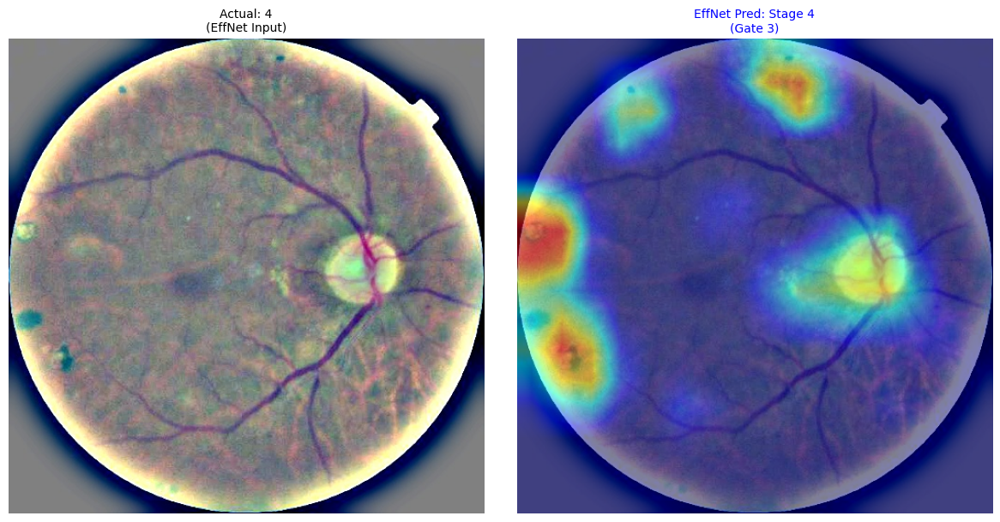

In [16]:

# Optimized Run
print(f"EffNet Audit: Optimized Thresholds {best_thresholds} ")
for label in sorted(class_samples.keys()):
    img_path = class_samples[label]
    print(f"\nEfficientNet Audit: Class {label}")
    plot_gradcam_effnet(class_samples[label], label, model, val_transform, best_thresholds)
